In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/weight/train/vehicle_yolov8/BoxR_curve.png
/kaggle/input/weight/train/vehicle_yolov8/train_batch3761.jpg
/kaggle/input/weight/train/vehicle_yolov8/val_batch0_pred.jpg
/kaggle/input/weight/train/vehicle_yolov8/confusion_matrix.png
/kaggle/input/weight/train/vehicle_yolov8/BoxPR_curve.png
/kaggle/input/weight/train/vehicle_yolov8/results.png
/kaggle/input/weight/train/vehicle_yolov8/val_batch1_pred.jpg
/kaggle/input/weight/train/vehicle_yolov8/args.yaml
/kaggle/input/weight/train/vehicle_yolov8/val_batch2_labels.jpg
/kaggle/input/weight/train/vehicle_yolov8/labels.jpg
/kaggle/input/weight/train/vehicle_yolov8/confusion_matrix_normalized.png
/kaggle/input/weight/train/vehicle_yolov8/train_batch3762.jpg
/kaggle/input/weight/train/vehicle_yolov8/train_batch2.jpg
/kaggle/input/weight/train/vehicle_yolov8/val_batch2_pred.jpg
/kaggle/input/weight/train/vehicle_yolov8/train_batch1.jpg
/kaggle/input/weight/train/vehicle_yolov8/train_batch0.jpg
/kaggle/input/weight/train/vehicle_yol

In [2]:

import os
import shutil
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import torch
print("Torch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

Torch version: 2.6.0+cu124
CUDA available: True


In [3]:


!pip install ultralytics




   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 17.9 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 95.9 MB/s eta 0:00:00:00:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 72.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 38.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 3.4 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 86.0 MB/s eta 0:00:00:00:0100:01
  Attempting uninst

In [4]:
dataset_path = "/kaggle/input/vehicle-orientation-dataset-part-1/vehicle-orientation-1"

file_count = len(os.listdir(dataset_path))
print("Total files:", file_count)


Total files: 100000


In [5]:
import random

dataset_path = "/kaggle/input/vehicle-orientation-dataset-part-1/vehicle-orientation-1"
train_img = "/kaggle/working/dataset/train/images"
train_lbl = "/kaggle/working/dataset/train/labels"
val_img = "/kaggle/working/dataset/val/images"
val_lbl = "/kaggle/working/dataset/val/labels"
test_img = "/kaggle/working/dataset/test/images"
test_lbl = "/kaggle/working/dataset/test/labels"

for path in [train_img, train_lbl, val_img, val_lbl, test_img, test_lbl]:
    os.makedirs(path, exist_ok=True)


all_images = [f for f in os.listdir(dataset_path) if f.lower().endswith('.jpg')]
valid_images = [img for img in all_images if os.path.exists(os.path.join(dataset_path, os.path.splitext(img)[0] + ".txt"))]


selected_images = random.sample(valid_images, 5000)

train_images = selected_images[:3000]
val_images = selected_images[3000:4000]
test_images = selected_images[4000:5000]

# Function to copy pairs
def copy_pairs(images, dst_img, dst_lbl):
    for img in images:
        txt = os.path.splitext(img)[0] + ".txt"
        shutil.copy(os.path.join(dataset_path, img), os.path.join(dst_img, img))
        shutil.copy(os.path.join(dataset_path, txt), os.path.join(dst_lbl, txt))

# Copy train, val, and test sets
copy_pairs(train_images, train_img, train_lbl)
copy_pairs(val_images, val_img, val_lbl)
copy_pairs(test_images, test_img, test_lbl)

print("Done: 3000 train, 1000 val, and 1000 test images with labels copied.")


Done: 3000 train, 1000 val, and 1000 test images with labels copied.


In [5]:

def check_labels(img_path, lbl_path):
    missing = []
    for img in os.listdir(img_path):
        if img.endswith(".jpg"):
            label = os.path.splitext(img)[0] + ".txt"
            if not os.path.exists(os.path.join(lbl_path, label)):
                missing.append(label)
    if missing:
        print(f"Missing labels in {img_path}:", missing)
    else:
        print(f"All images in {img_path} have matching label files.")


check_labels("/kaggle/working/dataset/train/images", "/kaggle/working/dataset/train/labels")
check_labels("/kaggle/working/dataset/val/images", "/kaggle/working/dataset/val/labels")
check_labels("/kaggle/working/dataset/test/images", "/kaggle/working/dataset/test/labels")


All images in /kaggle/working/dataset/train/images have matching label files.
All images in /kaggle/working/dataset/val/images have matching label files.
All images in /kaggle/working/dataset/test/images have matching label files.


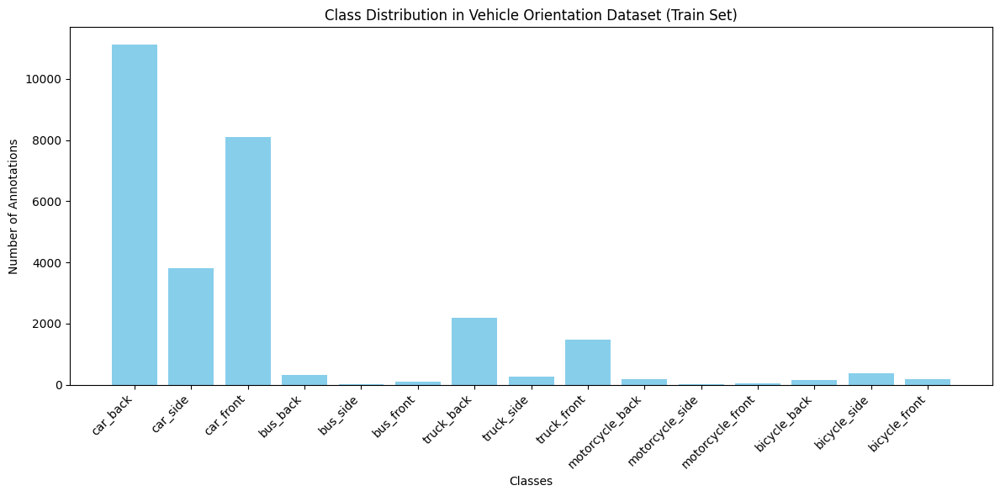

In [7]:

labels_path = train_lbl 

class_names = [
    'car_back', 'car_side', 'car_front',
    'bus_back', 'bus_side', 'bus_front',
    'truck_back', 'truck_side', 'truck_front',
    'motorcycle_back', 'motorcycle_side', 'motorcycle_front',
    'bicycle_back', 'bicycle_side', 'bicycle_front'c
]

class_counts = np.zeros(len(class_names), dtype=int)

for file in os.listdir(labels_path):
    if file.endswith(".txt"):
        with open(os.path.join(labels_path, file), "r") as f:
            for line in f.readlines():
                cls_id = int(line.split()[0])
                class_counts[cls_id] += 1

plt.figure(figsize=(12, 6))
plt.bar(range(len(class_names)), class_counts, tick_label=class_names, color='skyblue')
plt.xticks(rotation=45, ha="right")
plt.title("Class Distribution in Vehicle Orientation Dataset (Train Set)")
plt.xlabel("Classes")
plt.ylabel("Number of Annotations")
plt.tight_layout()
plt.show()


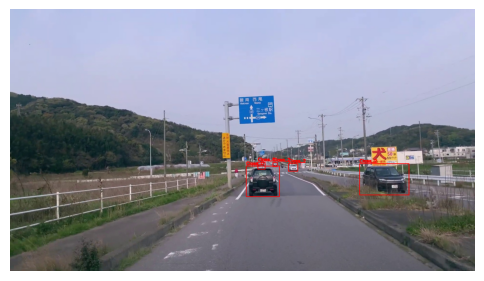

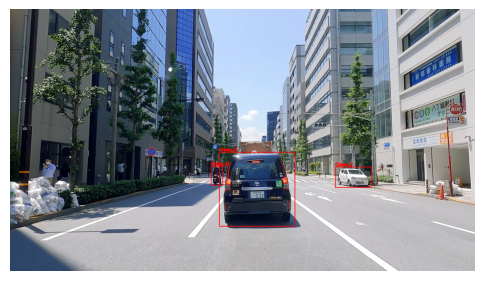

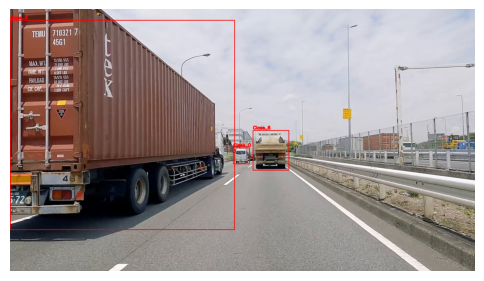

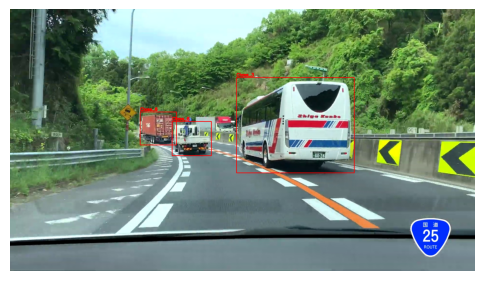

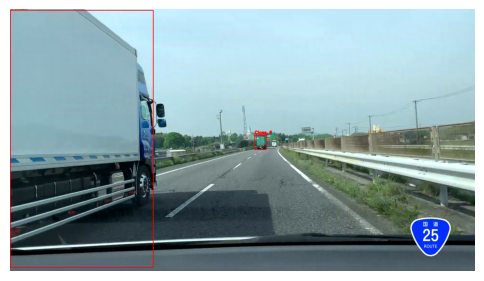

In [7]:

train_images_path = "/kaggle/working/dataset/train/images"
train_labels_path = "/kaggle/working/dataset/train/labels"


class_names = [f"Class_{i}" for i in range(15)]


sample_images = random.sample(os.listdir(train_images_path), 5)

for img_file in sample_images:
    img_path = os.path.join(train_images_path, img_file) 
    label_path = os.path.join(train_labels_path, os.path.splitext(img_file)[0] + ".txt")
    
 
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    
    if os.path.exists(label_path):
        h, w, _ = img.shape
        with open(label_path, "r") as f:
            for line in f.readlines():
                cls, x_center, y_center, bw, bh = map(float, line.split())
                x1 = int((x_center - bw / 2) * w)
                y1 = int((y_center - bh / 2) * h)
                x2 = int((x_center + bw / 2) * w)
                y2 = int((y_center + bh / 2) * h)
                
                # Draw rectangle
                cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)
                # Put class label text
                cls_name = class_names[int(cls)]
                cv2.putText(img, cls_name, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 
                            0.6, (255, 0, 0), 2, cv2.LINE_AA)
    
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.axis('off')
    plt.show()


In [2]:
yaml_content = """
path: /kaggle/working/dataset
train: /kaggle/working/dataset/train/images
val: /kaggle/working/dataset/val/images
test: /kaggle/working/dataset/test/images

nc: 15
names:
  [
    'car_back', 'car_side', 'car_front',
    'bus_back', 'bus_side', 'bus_front',
    'truck_back', 'truck_side', 'truck_front',
    'motorcycle_back', 'motorcycle_side', 'motorcycle_front',
    'bicycle_back', 'bicycle_side', 'bicycle_front'
  ]
"""

with open("data.yaml", "w") as f:
    f.write(yaml_content)

# Confirm it's written correctly
!cat data.yaml



path: /kaggle/working/dataset
train: /kaggle/working/dataset/train/images
val: /kaggle/working/dataset/val/images
test: /kaggle/working/dataset/test/images

nc: 15
names:
  [
    'car_back', 'car_side', 'car_front',
    'bus_back', 'bus_side', 'bus_front',
    'truck_back', 'truck_side', 'truck_front',
    'motorcycle_back', 'motorcycle_side', 'motorcycle_front',
    'bicycle_back', 'bicycle_side', 'bicycle_front'
  ]


In [9]:
!find . -name "data.yaml"

./data.yaml


In [1]:
from ultralytics import YOLO

model = YOLO('yolov8m.pt') 
model.train(
    data='data.yaml',
    epochs=30,
    imgsz=640,
    project='runs/train',
    name='vehicle_yolov8',
    exist_ok=True
)


Ultralytics 8.3.169 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8m.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=vehicle_yolov8, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretraine

train: Scanning /kaggle/working/dataset/train/labels... 3000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3000/3000 [00:02<00:00, 1394.07it/s]

train: New cache created: /kaggle/working/dataset/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1572.3±1232.5 MB/s, size: 415.5 KB)


val: Scanning /kaggle/working/dataset/val/labels... 1000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<00:00, 1210.62it/s]


val: New cache created: /kaggle/working/dataset/val/labels.cache
Plotting labels to runs/train/vehicle_yolov8/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000526, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/train/vehicle_yolov8
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      7.78G      0.998        1.4      1.014         43        640: 100%|██████████| 188/188 [01:59<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:10<00:00,  3.10it/s]


                   all       1000       4992       0.65      0.395      0.421      0.277

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      7.84G     0.9262      0.941      1.001         72        640: 100%|██████████| 188/188 [01:57<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.37it/s]


                   all       1000       4992      0.683      0.399      0.447      0.299

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      7.91G     0.9269     0.9128      1.005         91        640: 100%|██████████| 188/188 [01:56<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.37it/s]


                   all       1000       4992      0.617      0.403      0.409      0.268

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      7.98G     0.9074     0.8526     0.9999         45        640: 100%|██████████| 188/188 [01:56<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.38it/s]


                   all       1000       4992      0.568      0.459      0.456      0.313

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30       8.1G     0.8876     0.8009     0.9904         73        640: 100%|██████████| 188/188 [01:56<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.41it/s]


                   all       1000       4992       0.58      0.449      0.466      0.324

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      8.28G     0.8645     0.7653     0.9825         87        640: 100%|██████████| 188/188 [01:56<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.41it/s]

                   all       1000       4992      0.502      0.512      0.492      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      8.11G     0.8492     0.7412     0.9753         52        640: 100%|██████████| 188/188 [01:56<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.41it/s]


                   all       1000       4992      0.531      0.482      0.478      0.334

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      8.09G     0.8282     0.7073     0.9614         57        640: 100%|██████████| 188/188 [01:56<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.41it/s]

                   all       1000       4992      0.564      0.474      0.506      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30       8.1G     0.8078     0.6806     0.9528         79        640: 100%|██████████| 188/188 [01:56<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.43it/s]

                   all       1000       4992      0.578      0.521      0.562      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30       8.1G     0.8002     0.6599     0.9504         63        640: 100%|██████████| 188/188 [01:56<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.39it/s]


                   all       1000       4992      0.431      0.549      0.527      0.375

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30       8.1G     0.7871     0.6372     0.9469         95        640: 100%|██████████| 188/188 [01:56<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.39it/s]


                   all       1000       4992      0.707      0.496      0.554      0.391

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30       8.1G     0.7697     0.6135     0.9399         37        640: 100%|██████████| 188/188 [01:56<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.34it/s]

                   all       1000       4992      0.477      0.572       0.55      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30       8.1G     0.7693     0.6114     0.9369         38        640: 100%|██████████| 188/188 [01:56<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.39it/s]

                   all       1000       4992      0.566      0.556      0.584      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30       8.1G     0.7503     0.5903     0.9347         67        640: 100%|██████████| 188/188 [01:56<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.35it/s]

                   all       1000       4992      0.663      0.558      0.576      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      8.28G     0.7427     0.5754     0.9236         58        640: 100%|██████████| 188/188 [01:56<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.40it/s]

                   all       1000       4992      0.531      0.621      0.579      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30       8.1G     0.7279     0.5587     0.9218         37        640: 100%|██████████| 188/188 [01:56<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.42it/s]

                   all       1000       4992      0.763      0.545       0.61      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      8.28G     0.7145     0.5269     0.9152         48        640: 100%|██████████| 188/188 [01:56<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.39it/s]

                   all       1000       4992      0.618      0.559      0.637      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      8.09G     0.7093     0.5312     0.9133         68        640: 100%|██████████| 188/188 [01:56<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.45it/s]

                   all       1000       4992      0.634      0.591      0.643      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30       8.1G     0.6992     0.5144      0.911         69        640: 100%|██████████| 188/188 [01:56<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.37it/s]

                   all       1000       4992      0.651      0.638      0.671      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30       8.1G     0.6846     0.5016     0.9029         65        640: 100%|██████████| 188/188 [01:56<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.44it/s]

                   all       1000       4992      0.657      0.553       0.66      0.483


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30       8.1G     0.6762     0.4725     0.8966         44        640: 100%|██████████| 188/188 [01:57<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.37it/s]

                   all       1000       4992      0.605      0.645      0.665      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30       8.1G     0.6693     0.4614     0.8948         34        640: 100%|██████████| 188/188 [01:56<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.35it/s]

                   all       1000       4992      0.605      0.607      0.641      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30       8.1G     0.6508     0.4439     0.8864         44        640: 100%|██████████| 188/188 [01:56<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.41it/s]

                   all       1000       4992      0.628      0.657      0.679      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      8.28G     0.6397     0.4329     0.8828         45        640: 100%|██████████| 188/188 [01:56<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.42it/s]

                   all       1000       4992      0.653      0.646      0.678       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30       8.1G     0.6268     0.4142     0.8757         47        640: 100%|██████████| 188/188 [01:56<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.43it/s]

                   all       1000       4992       0.68      0.613      0.673      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      8.28G     0.6201     0.4086     0.8702         36        640: 100%|██████████| 188/188 [01:56<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.40it/s]

                   all       1000       4992      0.745      0.561      0.679       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30       8.1G     0.6085      0.393     0.8706         32        640: 100%|██████████| 188/188 [01:56<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.44it/s]

                   all       1000       4992      0.719      0.551      0.661      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30       8.1G     0.5962     0.3857     0.8673         41        640: 100%|██████████| 188/188 [01:56<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.41it/s]

                   all       1000       4992      0.684      0.565      0.669      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30       8.1G     0.5842     0.3757     0.8617         35        640: 100%|██████████| 188/188 [01:56<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.42it/s]

                   all       1000       4992      0.686       0.59      0.686      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30       8.1G     0.5769     0.3673     0.8594         40        640: 100%|██████████| 188/188 [01:56<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.43it/s]

                   all       1000       4992      0.678      0.577      0.678      0.499



30 epochs completed in 1.063 hours.
Optimizer stripped from runs/train/vehicle_yolov8/weights/last.pt, 52.0MB
Optimizer stripped from runs/train/vehicle_yolov8/weights/best.pt, 52.0MB

Validating runs/train/vehicle_yolov8/weights/best.pt...
Ultralytics 8.3.169 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 92 layers, 25,848,445 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:11<00:00,  2.89it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1000       4992      0.678      0.577      0.678      0.499
              car_back        839       1961      0.918      0.874       0.95      0.814
              car_side        346        689      0.769       0.79      0.847      0.605
             car_front        615       1399      0.866      0.823      0.906      0.718
              bus_back         57         65      0.729      0.746      0.775      0.634
              bus_side          3          3          0          0     0.0472     0.0315
             bus_front         15         15      0.771      0.467      0.511      0.416
            truck_back        311        405      0.927      0.827      0.933      0.782
            truck_side         38         43      0.598      0.512      0.613      0.427
           truck_front        191        261      0.791      0.762      0.862      0.681
       motorcycle_back         33         38          1      0.378      0.758      0.471
       motorcycle_sid

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7a3dc7695a10>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,   


0: 384x640 1 car_back, 1 car_front, 7.5ms
1: 384x640 1 car_back, 2 car_sides, 1 truck_back, 1 truck_side, 7.5ms
2: 384x640 4 car_sides, 1 car_front, 7.5ms
3: 384x640 4 car_backs, 6 car_sides, 7.5ms
4: 384x640 2 car_backs, 1 car_front, 3 truck_backs, 1 truck_front, 7.5ms
5: 384x640 1 car_back, 2 car_sides, 3 car_fronts, 7.5ms
6: 384x640 8 car_backs, 7.5ms
7: 384x640 1 car_back, 1 car_side, 1 truck_back, 7.5ms
8: 384x640 1 car_back, 2 car_sides, 1 car_front, 2 truck_backs, 2 truck_sides, 7.5ms
9: 384x640 2 car_backs, 2 car_sides, 4 car_fronts, 7.5ms
Speed: 1.9ms preprocess, 7.5ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


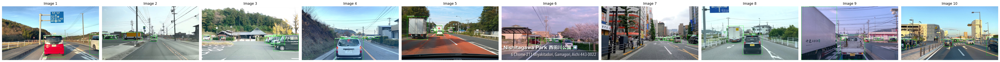

In [4]:

import glob


# Load trained model
model = YOLO("runs/train/vehicle_yolov8/weights/best.pt")

# Path to test images
test_images_path = "/kaggle/working/dataset/test/images"
all_test_images = glob.glob(test_images_path + "/*")

# Pick 3 to 5 random images
num_images = random.randint(1, 20)
sample_images = random.sample(all_test_images, num_images)

# Run predictions
results = model(sample_images)

# Plot results
fig, axes = plt.subplots(1, num_images, figsize=(5 * num_images, 5))
if num_images == 1:
    axes = [axes]     

for idx, (img_path, result) in enumerate(zip(sample_images, results)):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Draw predicted boxes with class names
    if result.boxes is not None:
        boxes = result.boxes.xyxy.cpu().numpy()
        scores = result.boxes.conf.cpu().numpy()
        classes = result.boxes.cls.cpu().numpy().astype(int)
        
        for box, score, cls in zip(boxes, scores, classes):
            x1, y1, x2, y2 = map(int, box)
            cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
            label = f"{model.names[cls]} ({score:.2f})"
            cv2.putText(img, label, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 
                        0.5, (255, 255, 255), 2, lineType=cv2.LINE_AA)

    axes[idx].imshow(img)
    axes[idx].axis("off")
    axes[idx].set_title(f"Image {idx + 1}")

plt.tight_layout()
plt.show()
                                                                 

In [3]:
from ultralytics import YOLO
model = YOLO("/kaggle/input/weight/train/vehicle_yolov8/weights/best.pt")
data_yaml = "/kaggle/working/data.yaml" 

results = model.val(data=data_yaml, split="test")

print("mAP50: {:.3f}".format(results.box.map50))
print("mAP50-95: {:.3f}".format(results.box.map))
print("Precision: {:.3f}".format(results.box.p.mean()))
print("Recall: {:.3f}".format(results.box.r.mean()))

Ultralytics 8.3.169 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 92 layers, 25,848,445 parameters, 0 gradients, 78.7 GFLOPs


100%|██████████| 755k/755k [00:00<00:00, 18.3MB/s]

val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3761.9±1044.2 MB/s, size: 535.0 KB)



val: Scanning /kaggle/working/dataset/test/labels... 1000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<00:00, 1490.90it/s]

val: New cache created: /kaggle/working/dataset/test/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:11<00:00,  5.32it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1000       4852       0.71      0.686      0.755      0.562
              car_back        825       1820       0.94      0.868       0.95      0.813
              car_side        351        645      0.779      0.794       0.85      0.613
             car_front        677       1529      0.869      0.835      0.916      0.724
              bus_back         50         51      0.653      0.702      0.669      0.562
              bus_side          4          6      0.597        0.5      0.461      0.332
             bus_front         13         13      0.765      0.615      0.727      0.537
            truck_back        273        349      0.914      0.851      0.937      0.785
            truck_side         26         30      0.556        0.6       0.58      0.419
           truck_front        222        284      0.799      0.775      0.879      0.684
       motorcycle_back         24         31          1      0.462      0.742      0.473
       motorcycle_sid

In [5]:
import shutil

shutil.make_archive('/kaggle/working/runs_backup', 'zip', '/kaggle/working/runs')

'/kaggle/working/runs_backup.zip'

In [7]:
from ultralytics import YOLO
import yaml
import os

# Path to your trained model
model_path = "runs/train/vehicle_yolov8/weights/best.pt"

# Path to dataset YAML
data_yaml = "/kaggle/working/data.yaml"

with open(data_yaml, 'r') as f:
    data_config = yaml.safe_load(f)

# Add test path if missing
if 'test' not in data_config:
    data_config['test'] = 'test/images'  
    with open(data_yaml, 'w') as f:
        yaml.dump(data_config, f)
    print("Added 'test:' section to YAML.")


model = YOLO(model_path)


results = model.val(data=data_yaml, split="test")


print("Evaluation Metrics on Test Set:")
print(f"mAP50: {results.box.map50:.3f}")
print(f"mAP50-95: {results.box.map:.3f}")
print(f"Precision: {results.box.p.mean():.3f}")
print(f"Recall: {results.box.r.mean():.3f}")


Ultralytics 8.3.169 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 92 layers, 25,848,445 parameters, 0 gradients, 78.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2514.5±366.8 MB/s, size: 429.1 KB)


val: Scanning /kaggle/working/dataset/test/labels... 1000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<00:00, 1396.87it/s]

val: New cache created: /kaggle/working/dataset/test/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:12<00:00,  5.20it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1000       5001      0.668      0.636      0.685      0.491
              car_back        836       1979      0.913      0.871      0.952      0.812
              car_side        330        611      0.724      0.776      0.811      0.582
             car_front        644       1469      0.869      0.828      0.912      0.716
              bus_back         56         59      0.715      0.729      0.761      0.647
              bus_side          8          8      0.651      0.471      0.552      0.315
             bus_front          7          7      0.339      0.286      0.277      0.224
            truck_back        280        386      0.917      0.863      0.943      0.799
            truck_side         44         48      0.694      0.521      0.601      0.398
           truck_front        203        262      0.758      0.847      0.876      0.683
       motorcycle_back         13         13      0.604      0.588      0.528      0.339
       motorcycle_sid